In [1]:
#* for data manipulation 
import pandas as pd 
import numpy as np 

import tiling_disk_plots as tdp
import tiling_disk_utils as tdu

#* sometimes needed for creating bins for histograms 
from astropy.stats import knuth_bin_width

#* for plotting: 
import matplotlib.pyplot as plt 
import seaborn as sns
%matplotlib inline
sns.set_theme(style="ticks")
sns.set_context("talk")

### import table map

In [2]:
table_map = tdu.read_single_measurement('MSA', '20211214_table_top.txt')
table_map = tdu.add_ring_nr_label(table_map)
table_map = tdu.df_convert_unix_to_datetime(table_map)
# table_map = table_map.query('-158 < z')

# table_map['z'] = tdu.subtract_mean(table_map['z'])
# table_map['z'] = tdu.convert_mm_to_microns(table_map['z'] )
table_map_pt = tdu.point_table(table_map)
table_map_pt = tdu.add_triplet_color_label(table_map_pt)

In [3]:
table_map_pt

,hex_nr,point,unix_time,x,y,z_mean,z_measurement_error,trip_color
0,1,1,1.639488e+09,4.20,4.24,-158.097636,0.214150,white
1,1,2,1.639488e+09,3.36,12.56,-158.882154,0.015496,white
2,1,3,1.639488e+09,9.19,9.19,-157.379154,0.013510,white
3,1,4,1.639488e+09,12.56,3.36,-157.384385,0.016519,white
4,1,5,1.639488e+09,19.32,5.18,-157.396077,0.014768,white
...,...,...,...,...,...,...,...,...
1135,19,56,1.639495e+09,-90.89,30.43,-157.389154,0.016039,blue
1136,19,57,1.639495e+09,-84.38,33.13,-157.708308,0.170111,blue
1137,19,58,1.639495e+09,-78.79,37.42,-158.350615,0.183287,blue
1138,19,59,1.639495e+09,-74.50,43.01,-158.788615,0.018765,blue


In [4]:
table_map_pt.z_mean.describe()

count    1140.000000
mean     -157.701822
std         0.493886
min      -158.918846
25%      -157.921519
50%      -157.431577
75%      -157.393077
max      -157.350462
Name: z_mean, dtype: float64

In [5]:
table_map_pt.z_mean.min()

-158.91884615384618

Text(0.5, 1.0, 'Table measurement')

posx and posy should be finite values


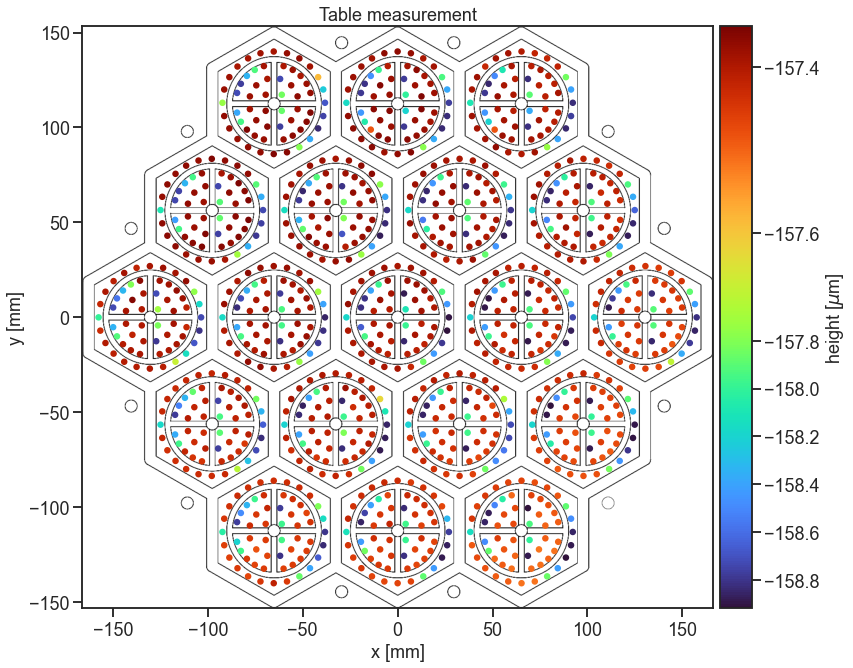

In [6]:
fig, ax = tdp.full_hexagon_plot(table_map_pt, size=5**2, cbar_norm=(table_map_pt.z_mean.min(), table_map_pt.z_mean.mean(), table_map_pt.z_mean.max()), cmap='turbo')
ax.set_title('Table measurement')

### Read data

In [7]:
hardening_tripplets_df = tdu.read_single_measurement('MSA', '20220105_hardening_blbryl.txt')
# hardening_tripplets_df = tdu.add_ring_nr_label(hardening_tripplets_df)


before_hardening_tripplets_df = tdu.read_single_measurement('MSA', '20220105_before_glue_blbryl.txt')
# before_hardening_tripplets_df = tdu.add_ring_nr_label(before_hardening_tripplets_df)
before_hardening_tripplets_pt = tdu.point_table(before_hardening_tripplets_df)
before_hardening_tripplets_pt = tdu.add_triplet_color_label(before_hardening_tripplets_pt)

In [8]:
before_hardening_tripplets_pt.keys()

Index(['hex_nr', 'point', 'unix_time', 'x', 'y', 'z_mean',
       'z_measurement_error', 'trip_color'],
      dtype='object')

### Examine pre glue status

In [9]:
before_hardening_tripplets_pt['z_mean'].describe()

count    540.000000
mean    -156.450119
std        0.034192
min     -156.516154
25%     -156.478615
50%     -156.454923
75%     -156.422519
max     -156.362692
Name: z_mean, dtype: float64

In [10]:
before_hardening_tripplets_pt.keys()

Index(['hex_nr', 'point', 'unix_time', 'x', 'y', 'z_mean',
       'z_measurement_error', 'trip_color'],
      dtype='object')

Text(0.5, 1.0, 'Before Glue: No Vacuum')

posx and posy should be finite values


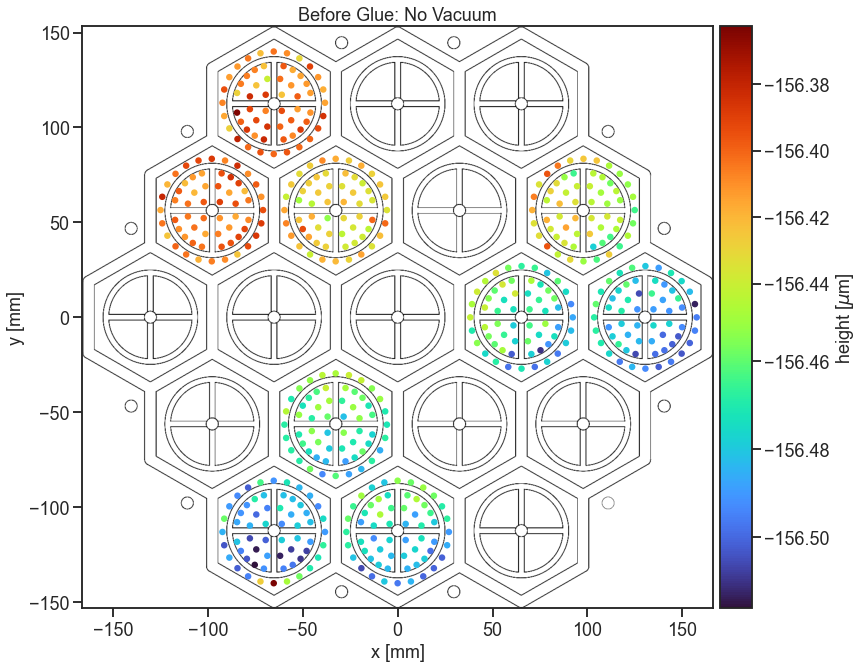

In [11]:
fig, ax = tdp.full_hexagon_plot(before_hardening_tripplets_pt, size=5**2,
                                cbar_norm=(before_hardening_tripplets_pt.z_mean.min(),
                                           before_hardening_tripplets_pt.z_mean.mean(),
                                           before_hardening_tripplets_pt.z_mean.max()),
                                cmap='turbo')
ax.set_title('Before Glue: No Vacuum')

# compare before glue to table 

In [12]:
table_map_pt.drop('trip_color', axis=1, inplace=True)

In [13]:
before_hardening_tripplets_pt.drop('trip_color', axis=1, inplace=True)

In [14]:
ref_sub_table = tdu.combine_mean_measurements(before_hardening_tripplets_pt, table_map_pt)

In [15]:
ref_sub_table['z_mean'] = tdu.convert_mm_to_microns(ref_sub_table['z_mean'])

In [16]:
ref_sub_table['z_mean'].describe()

count     540.000000
mean     1242.448148
std       495.183449
min       868.923077
25%       932.961538
50%       977.153846
75%      1453.865385
max      2472.076923
Name: z_mean, dtype: float64

(array([365.,  13.,  11.,  29.,  16.,  11.,  29.,   4.,  13.,  49.]),
 array([ 868.92307692, 1029.23846154, 1189.55384615, 1349.86923077,
        1510.18461538, 1670.5       , 1830.81538462, 1991.13076923,
        2151.44615385, 2311.76153846, 2472.07692308]),
 <BarContainer object of 10 artists>)

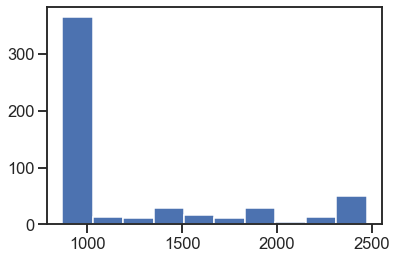

In [17]:
plt.hist(ref_sub_table['z_mean'])

(<Figure size 864x864 with 2 Axes>,
 <AxesSubplot:title={'center':'Before Glue - Table'}, xlabel='x [mm]', ylabel='y [mm]'>)

posx and posy should be finite values


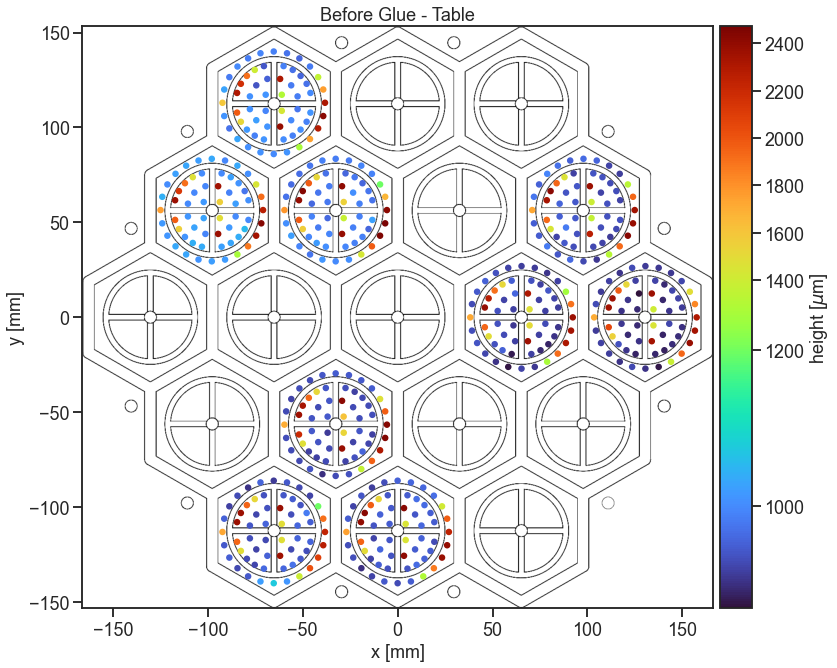

In [18]:
tdp.full_hexagon_plot(ref_sub_table, mode=('z_mean'), size=5**2,
                      cbar_norm=(ref_sub_table.z_mean.min(),
                                 ref_sub_table.z_mean.mean(),
                                 ref_sub_table.z_mean.max()),
                      cmap='turbo', title='Before Glue - Table') #? hier muss auf mm konvertiert werden

## hour 0 as reference

In [19]:
ref_df = tdu.point_table(hardening_tripplets_df.loc[hardening_tripplets_df.run_nr ==1, :])
discard_points = ref_df.query("z_mean > -154")
ref_df = ref_df.query("z_mean < -154")

In [20]:

discard_hex = discard_points.hex_nr
discard_point = discard_points.point
discard_points

,hex_nr,point,unix_time,x,y,z_mean,z_measurement_error
120,7,1,1.641395e+09,-28.39,60.75,-150.016154,6.113481


(<Figure size 504x432 with 1 Axes>,
 <AxesSubplot:xlabel='z [µm]', ylabel='Probability'>)

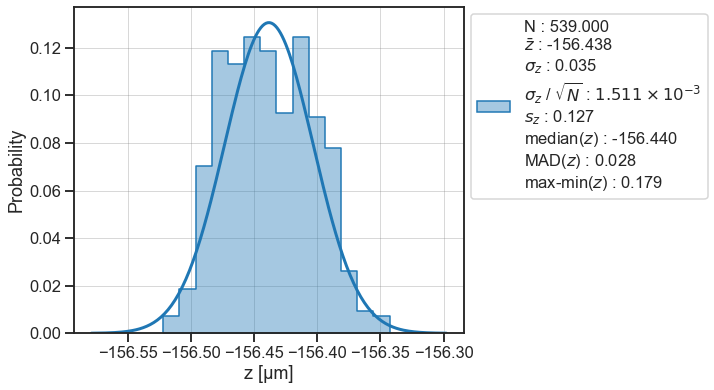

In [21]:
tdp.ts_hist(ref_df, mode="z_mean")

(<Figure size 864x864 with 2 Axes>,
 <AxesSubplot:title={'center':'Before Glue - Table'}, xlabel='x [mm]', ylabel='y [mm]'>)

posx and posy should be finite values


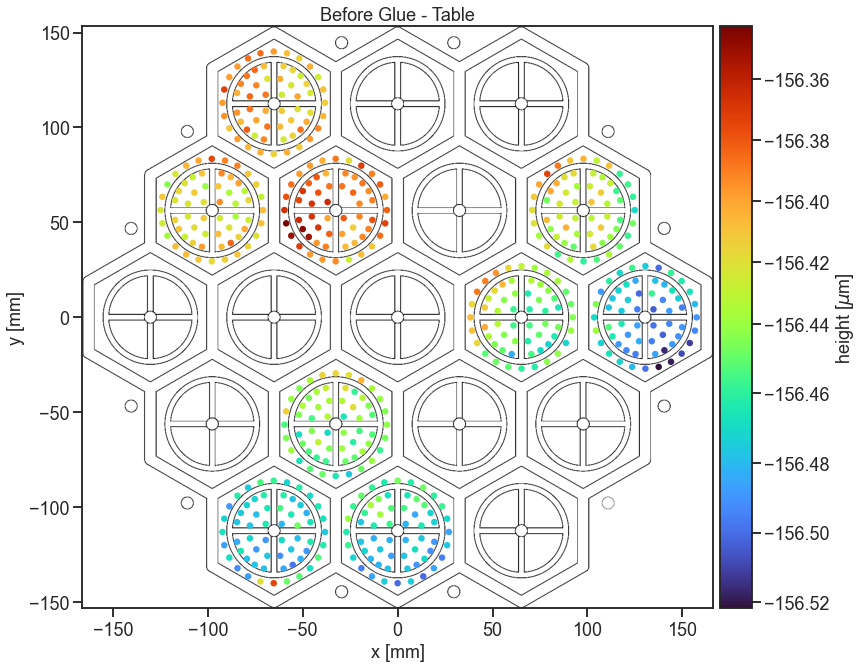

In [22]:
tdp.full_hexagon_plot(ref_df, mode=('z_mean'), size=5**2,
                      cbar_norm=(ref_df.z_mean.min(),
                                 ref_df.z_mean.mean(),
                                 ref_df.z_mean.max()),
                      cmap='turbo', title='Before Glue - Table') #? hier muss auf mm konvertiert werden

# Proceed with before glue as reference

In [23]:
before_hardening_tripplets_pt

,hex_nr,point,unix_time,x,y,z_mean,z_measurement_error
0,3,1,1.641380e+09,-28.43,-52.27,-156.481636,0.012414
1,3,2,1.641380e+09,-29.27,-43.95,-156.466923,0.015145
2,3,3,1.641380e+09,-23.44,-47.32,-156.451846,0.017596
3,3,4,1.641380e+09,-20.07,-53.15,-156.453692,0.016943
4,3,5,1.641380e+09,-13.31,-51.33,-156.463077,0.016104
...,...,...,...,...,...,...,...
535,19,56,1.641383e+09,-90.89,30.43,-156.408615,0.015351
536,19,57,1.641383e+09,-84.38,33.13,-156.424692,0.017279
537,19,58,1.641383e+09,-78.79,37.42,-156.394000,0.015885
538,19,59,1.641383e+09,-74.50,43.01,-156.386846,0.015515


### Split Data into runs

In [24]:
hardening_tripplets_df.run_nr.unique()[-1]

50

In [25]:
hardening_tripplets_df = hardening_tripplets_df.query(f'run_nr != {hardening_tripplets_df.run_nr.unique()[-1]}')

In [26]:
measurements_dict = {}
for run in hardening_tripplets_df.run_nr.unique(): 
    data = hardening_tripplets_df.loc[hardening_tripplets_df.run_nr == run, :]
    # print(data)
    measurements_dict[f'run_nr_{run}'] = data

In [27]:
measurements_dict_pt = {key: tdu.point_table(data) for key, data in measurements_dict.items()}

In [28]:
len(measurements_dict_pt)

49

In [29]:
for run_nr, data in measurements_dict_pt.items(): 
    data['run_nr'] = run_nr.split('_')[2]

In [30]:
measurements_dict_pt['run_nr_1'].iloc[120]

hex_nr                                 7
point                                  1
unix_time              1641395074.769231
x                                 -28.39
y                                  60.75
z_mean                       -150.016154
z_measurement_error             6.113481
run_nr                                 1
Name: 120, dtype: object

In [31]:
# for key, data in measurements_dict_pt.items(): 
#     run_nr = int(key.split('_')[2])
#     fig, ax = tdp.full_hexagon_plot(data, mode=('z_mean'), size=5**2, cbar_norm=(-157.056615, -156.981132, -156.879538), cmap='turbo', title=f'Hour {run_nr -1}')
#     # fig.savefig(f'Vac_timestory/{run_nr}_Measurement.png', dpi='figure', format='png', metadata=None,
#     #     bbox_inches=None, pad_inches=0.1,
#     #     facecolor='auto', edgecolor='auto',
#     #     backend=None
#     #    )
#     # plt.close()

In [32]:
measurements_dict_pt = {key: tdu.add_triplet_color_label(data) for key, data in measurements_dict_pt.items()}

discard the discared points

iloc an der stelle 120 muss raus, das ist der punkt den wir rauswerfen wollen der die statistik zerstoert

In [33]:
measurements_dict_pt = {key: data for key, data in measurements_dict_pt.items()}

here i subtract now hour 0 as reference

In [34]:
measurements_dict_pt = {key: tdu.combine_mean_measurements(data, ref_df) for key, data in measurements_dict_pt.items()}

In [35]:
measurements_dict_pt['run_nr_6']

,hex_nr,point,unix_time,x,y,z_mean,z_measurement_error,run_nr,trip_color
0,3,1,1.641413e+09,-28.39,-52.27,0.048462,0.020377,6,yellow
1,3,2,1.641413e+09,-29.27,-43.95,0.022231,0.024770,6,yellow
2,3,3,1.641413e+09,-23.44,-47.32,0.003077,0.021886,6,yellow
3,3,4,1.641413e+09,-20.07,-53.15,0.029615,0.021432,6,yellow
4,3,5,1.641413e+09,-13.31,-51.33,0.028154,0.021965,6,yellow
...,...,...,...,...,...,...,...,...,...
535,19,56,1.641411e+09,-90.89,30.43,0.042769,0.023886,6,blue
536,19,57,1.641411e+09,-84.38,33.13,0.001846,0.025028,6,blue
537,19,58,1.641411e+09,-78.79,37.42,0.044385,0.022217,6,blue
538,19,59,1.641411e+09,-74.50,43.01,0.036462,0.021741,6,blue


In [36]:
for key, data in measurements_dict_pt.items():
    data['z_mean'] = data['z_mean'].apply(lambda z: z*1e3) #* mm -> µm
    data['z_measurement_error'] = data['z_measurement_error'].apply(lambda z: z*1e3) #* mm -> µm
    measurements_dict_pt[key] = data

In [37]:
measurements_dict_pt['run_nr_1']

,hex_nr,point,unix_time,x,y,z_mean,z_measurement_error,run_nr,trip_color
0,3,1,1.641396e+09,-28.39,-52.27,0.0,19.440092,1,yellow
1,3,2,1.641396e+09,-29.27,-43.95,0.0,24.375981,1,yellow
2,3,3,1.641396e+09,-23.44,-47.32,0.0,22.549072,1,yellow
3,3,4,1.641396e+09,-20.07,-53.15,0.0,21.884498,1,yellow
4,3,5,1.641396e+09,-13.31,-51.33,0.0,20.246141,1,yellow
...,...,...,...,...,...,...,...,...,...
535,19,56,1.641395e+09,-90.89,30.43,0.0,26.370802,1,blue
536,19,57,1.641395e+09,-84.38,33.13,0.0,24.925268,1,blue
537,19,58,1.641395e+09,-78.79,37.42,0.0,21.104763,1,blue
538,19,59,1.641395e+09,-74.50,43.01,0.0,21.869352,1,blue


c:\Users\Domin\Nextcloud\Master\Disk_Tiling_Measurements\Fwd MADMAX Laser Scanning\tiling_disk_plots.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(ncols=1, nrows=1, figsize=figsize)


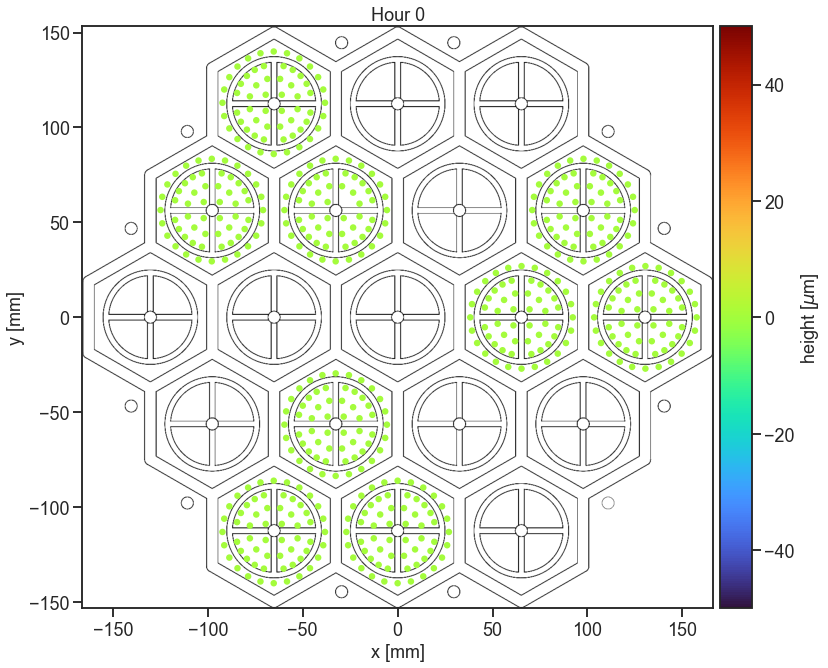

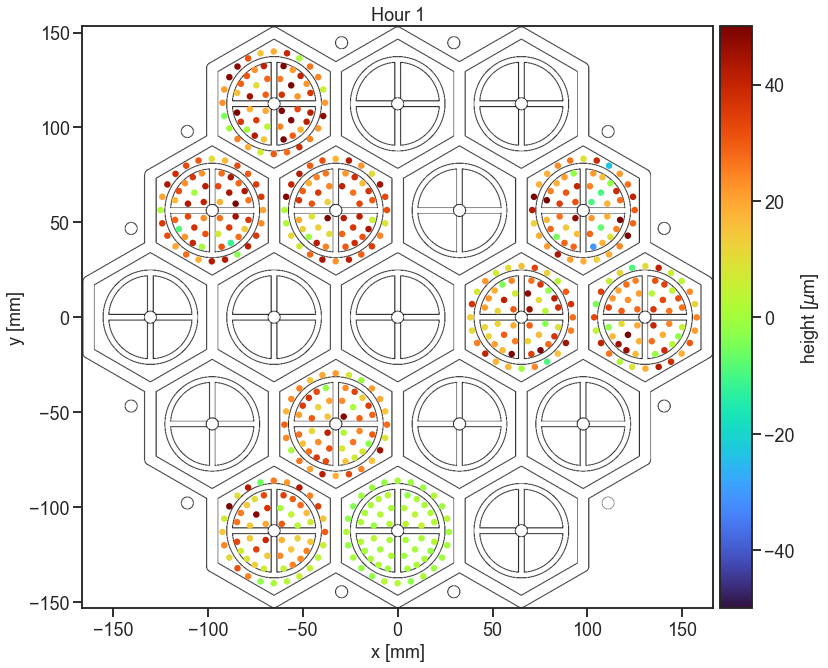

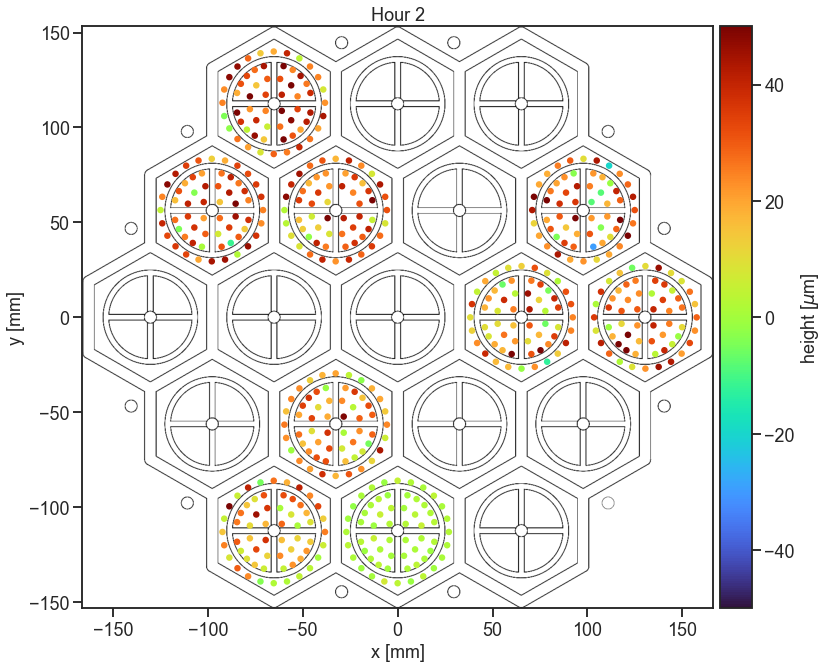

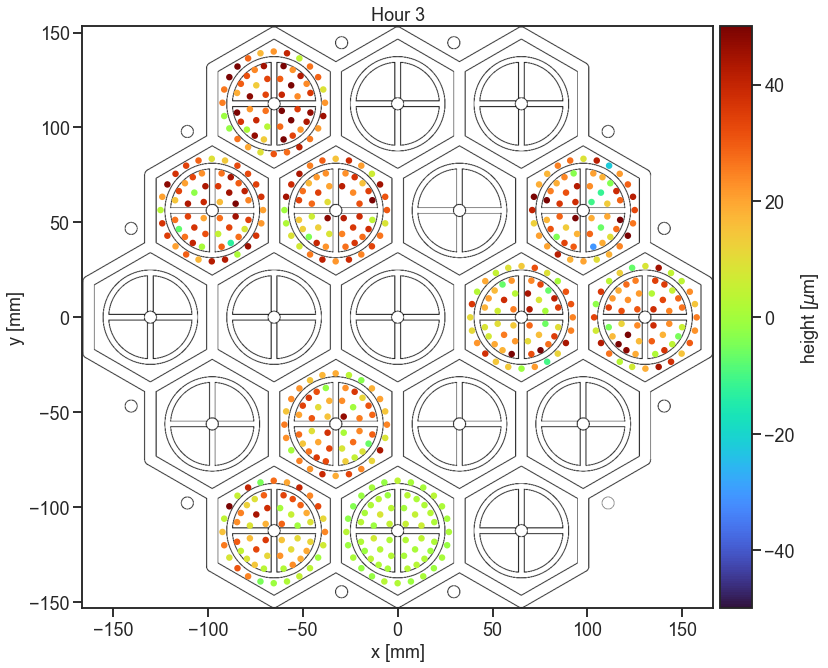

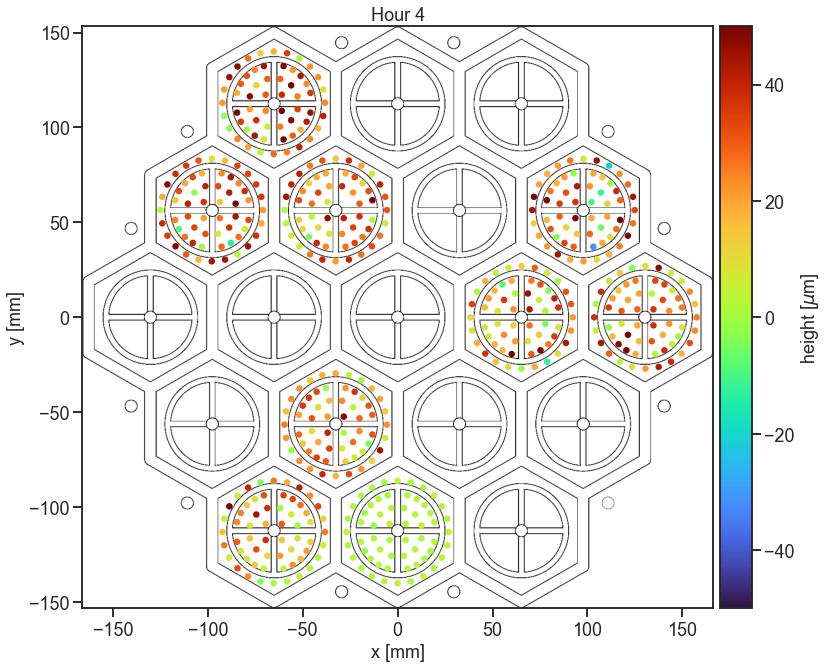

...

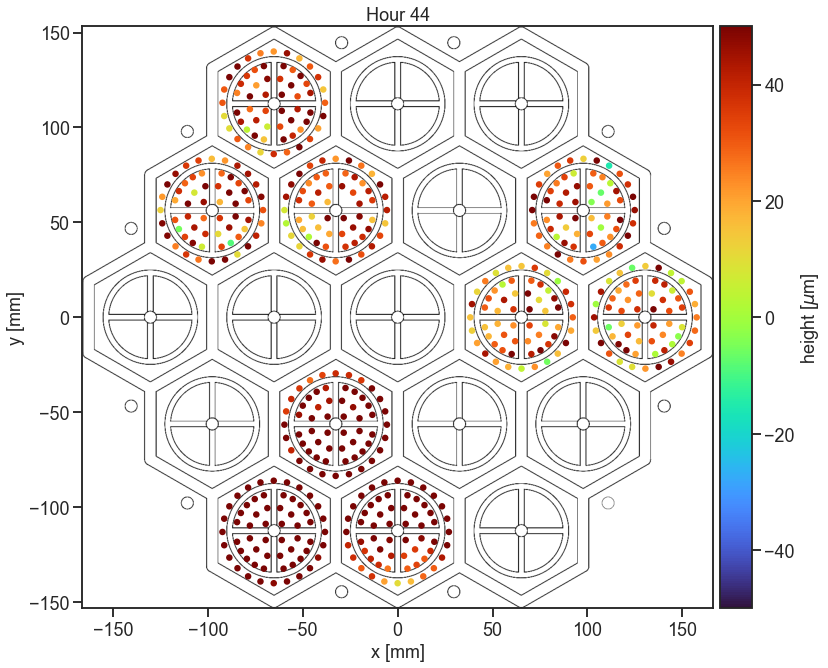

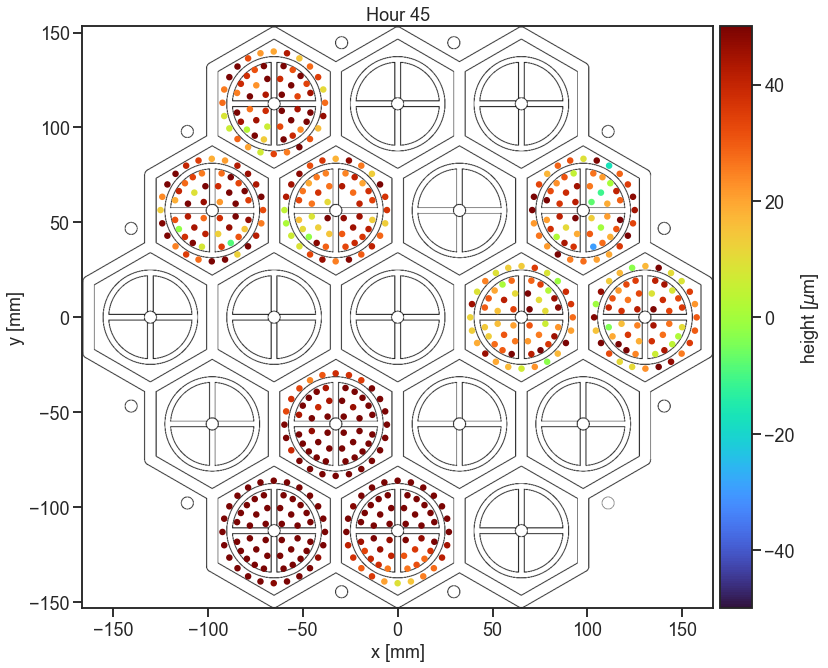

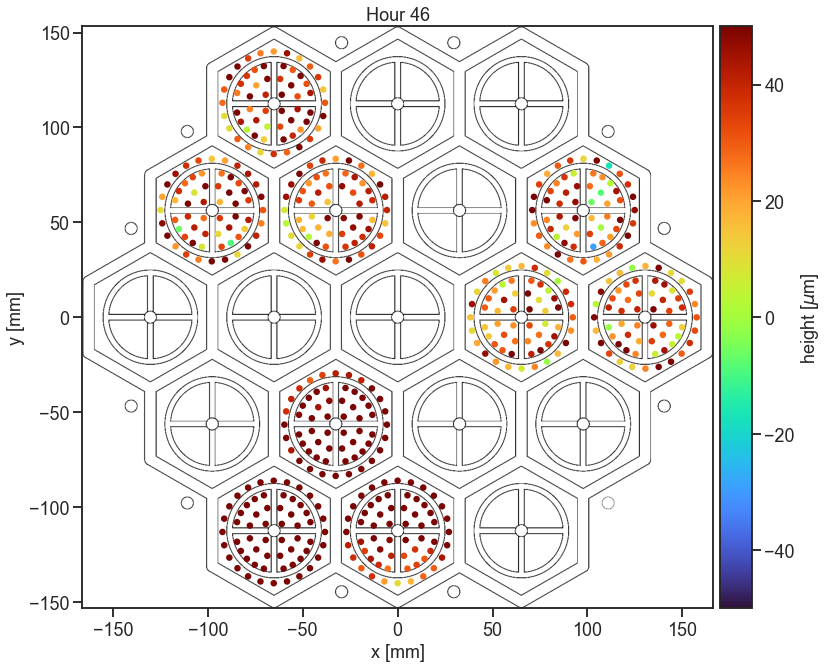

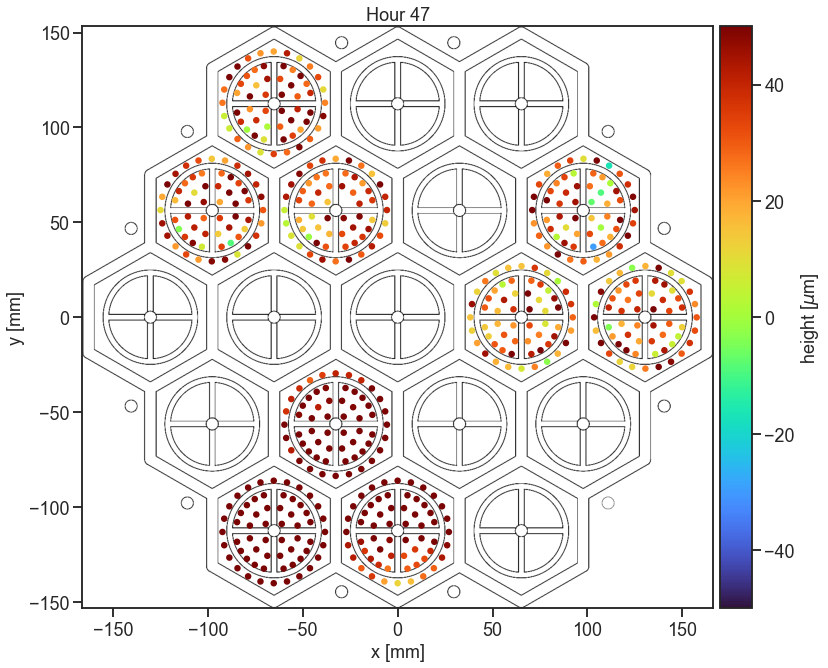

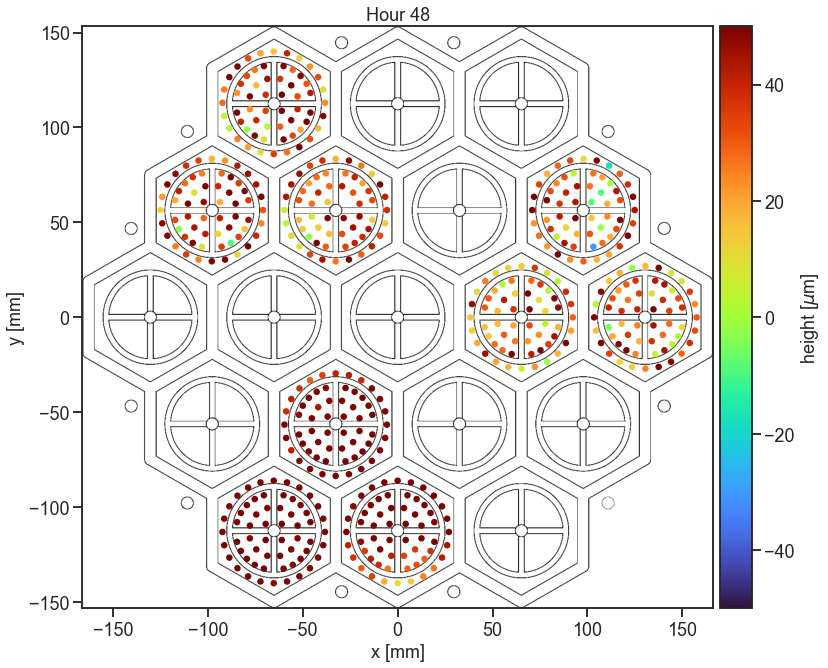

In [38]:
for key, data in measurements_dict_pt.items(): 
    run_nr = int(key.split('_')[2])
    fig, ax = tdp.full_hexagon_plot(data, mode=('z_mean'), size=5**2, cbar_norm=(-50, 0, 50), cmap='turbo', title=f'Hour {run_nr -1}')
    # fig.savefig(f'Vac_timestory/{run_nr}_Measurement.png', dpi='figure', format='png', metadata=None,
    #     bbox_inches=None, pad_inches=0.1,
    #     facecolor='auto', edgecolor='auto',
    #     backend=None
    #    )
    # plt.close()

# hier kommt jetzt der joyplot

erstmal die funktion schreiben um verteilung von einem triplet in einem run zu sehen 

In [39]:
#for key, data in measurements_dict_pt.items(): 
#    run_nr = int(key.split('_')[2])
#    data = data.loc[data.trip_color=='blue',:]
#    tdp.ts_hist(data, mode='z_mean')


In [40]:
def plot_triplet_dist_joyplot(all_triplet_data_dict, triplet_color='blue'): 

    from matplotlib import cm
    n_hours = len(all_triplet_data_dict)
    colors = cm.viridis_r(np.linspace(0, 1, n_hours))
    rgb_colors = [cm.winter_r(np.linspace(0, 1, n_hours)), cm.autumn_r(np.linspace(0, 1, n_hours)), cm.copper_r(np.linspace(0, 1, n_hours))]
    fig, axes = plt.subplots(n_hours,1, figsize=(6,14))
    i = 0
    z_global_max = 0 
    z_global_min = 0
    for key, data in all_triplet_data_dict.items(): 
        z_min = data.z_mean.min()
        z_max = data.z_mean.max()
        if z_max > z_global_max: z_global_max = np.rint(z_max)
        if z_min < z_global_min: z_global_min = np.rint(z_min)
    # print(z_global_max)
    # print(z_global_min)
    if z_global_max > 500: z_global_max = 100
    if z_global_min < -500: z_global_min = -100
    # print(z_global_max)
    # print(z_global_min)
    
    for (key, data), ax in zip(all_triplet_data_dict.items(), axes): 
        run_nr = int(key.split('_')[2])
        data = data.loc[data.trip_color==triplet_color,:]
        z_min = data.z_mean.min()
        z_max = data.z_mean.max()
        R = z_max - z_min
        R = np.round(R,2) 
        
        nbins = np.arange(z_global_min, z_global_max ,6)

        for (hex_nr,rgb) in zip(data.hex_nr.unique(), rgb_colors):
            # print(hex_nr)
            data_temp = data.loc[data.hex_nr==hex_nr,:]
            # print(f'hex_nr : {data.hex_nr.unique()}')
            sns.histplot(data_temp['z_mean'], kde=False, ax=ax, element='step', color=rgb[i],
                        stat='probability', label=f'Hour {run_nr-1}', fill=True, alpha=0.4, 
                        bins=nbins,)
            
        ax.spines.top.set_color('none')
        ax.spines.right.set_color('none')
        ax.axvline(0,0,1, ls='--', color='black')
        # ax.grid(True)
        plt.subplots_adjust(hspace=-0.3)
        # make background transparent
        rect = ax.patch
        rect.set_alpha(0)
        # remove borders, axis ticks, and labels
        ax.set_yticklabels([])
        ax.set_yticks([])
        ax.set_ylabel('')
        if i == n_hours - 1:
            ax.set_xlabel('z [µm]')
        else:
            ax.set_xticklabels([])
            ax.set_xticks([])
            ax.set_xlabel('')
        i+=1

        spines = ["top","right","left","bottom"]
        for s in spines:
            ax.spines[s].set_visible(False)
        ax.text(z_global_min -2 ,0.02,f'Hour {run_nr-1}',fontweight="bold",fontsize=14,ha="right", va='center')
        ax.text(z_global_max+2 ,0.02,f'R={R}',fontweight="bold",fontsize=14,ha="left", va='center')
    fig.text(0.07,0.9,f"{triplet_color} Triplet Distribution over Time",fontsize=18)
    return fig, axes

(<Figure size 432x1008 with 49 Axes>,
 array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:xlabel='z [µm]'>], dtype=object))

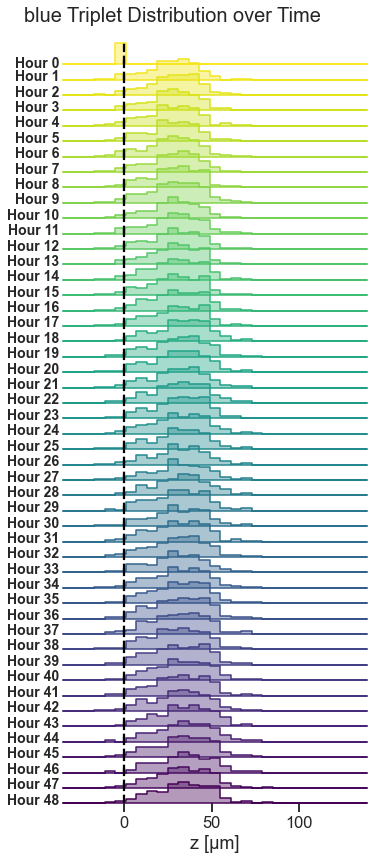

In [41]:
tdp.plot_triplet_dist_joyplot(measurements_dict_pt, 'blue')

(<Figure size 432x1008 with 49 Axes>,
 array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:xlabel='z [µm]'>], dtype=object))

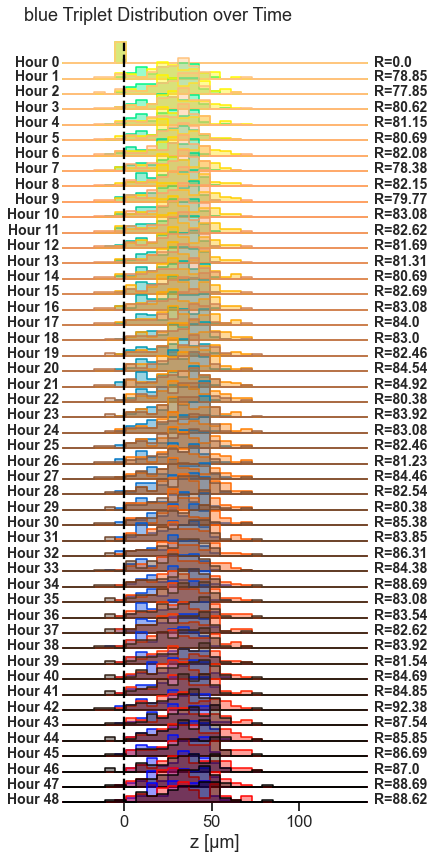

In [42]:
plot_triplet_dist_joyplot(measurements_dict_pt, 'blue')
#TODO: da nochmal minmax einbauen 

(<Figure size 432x1008 with 49 Axes>,
 array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:xlabel='z [µm]'>], dtype=object))

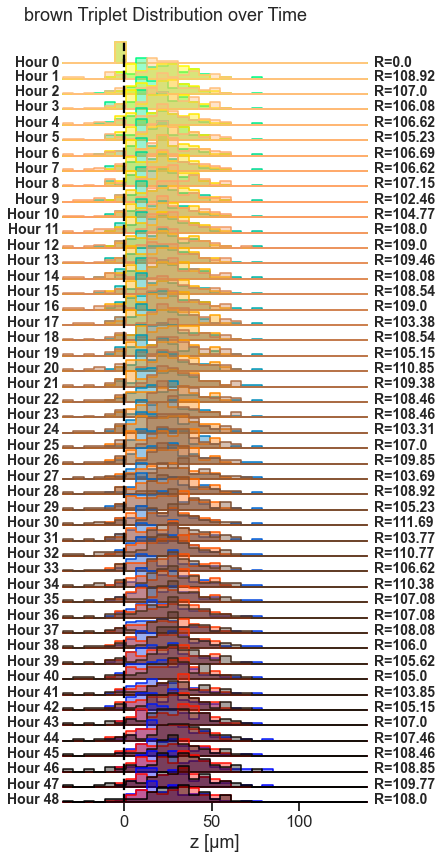

In [43]:
plot_triplet_dist_joyplot(measurements_dict_pt, 'brown')

(<Figure size 432x1008 with 49 Axes>,
 array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:xlabel='z [µm]'>], dtype=object))

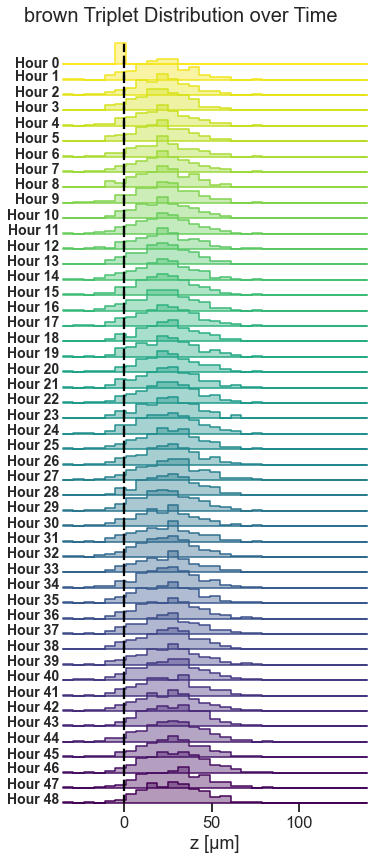

In [44]:
tdp.plot_triplet_dist_joyplot(measurements_dict_pt, 'brown')

(<Figure size 432x1008 with 49 Axes>,
 array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:xlabel='z [µm]'>], dtype=object))

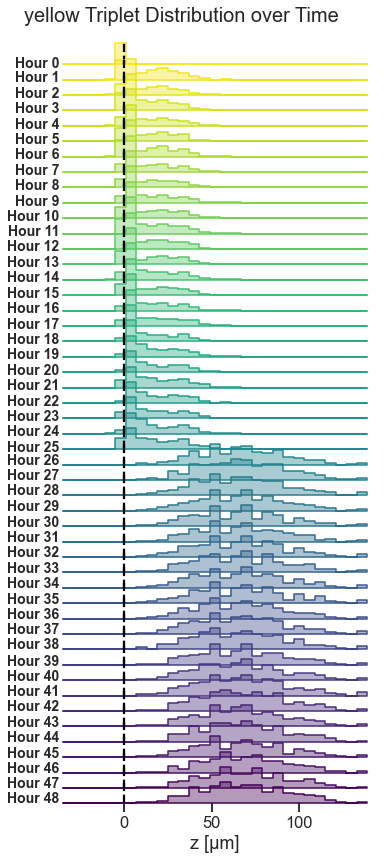

In [45]:
tdp.plot_triplet_dist_joyplot(measurements_dict_pt, 'yellow')

(<Figure size 432x1008 with 49 Axes>,
 array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:xlabel='z [µm]'>], dtype=object))

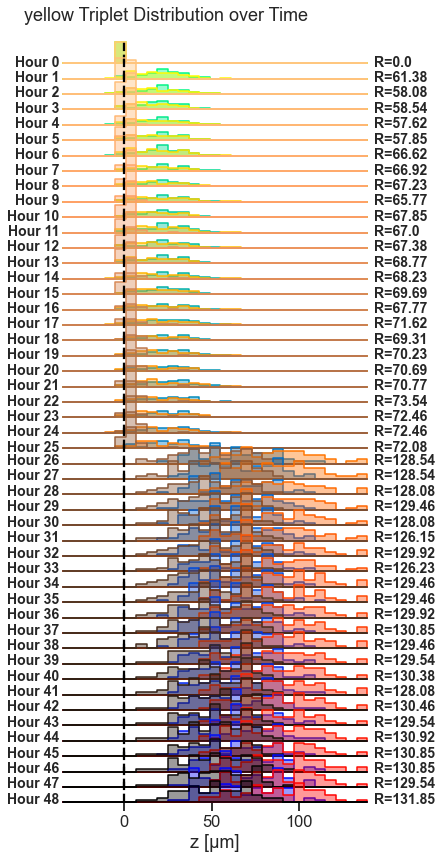

In [46]:
plot_triplet_dist_joyplot(measurements_dict_pt, 'yellow')